In [ ]:
import numpy as np
import pandas as pd
import os

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_openml

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.base import clone

In [2]:
BASE_PATH = "/kaggle/input/the-oxford-iii-t-pet-dataset/" 
IMAGES_PATH = os.path.join(BASE_PATH, "images/images")
ANNOTATIONS_PATH = os.path.join(BASE_PATH, "annotations/annotations")

IMG_SIZE = (128, 128)

In [3]:
import os
import cv2
import numpy as np
from sklearn.utils import shuffle

def load_data_complete(folder_path, img_size=(128, 128)):
    X = []
    y_especie = [] # 0: Gato, 1: Cachorro
    y_raca = []
    
    print("Carregando imagens e extraindo raças...")
    
    for filename in os.listdir(folder_path):
        if filename.endswith((".jpg", ".png", ".jpeg")):
            img_path = os.path.join(folder_path, filename)
            try:
                img = cv2.imread(img_path)
                if img is None: continue
                
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, img_size)
                
                if filename[0].islower():
                    label = 1 
                else:
                    label = 0 
                
                breed = filename.rsplit('_', 1)[0]
                
                X.append(img.flatten())
                y_especie.append(label)
                y_raca.append(breed)
                
            except Exception as e:
                pass

    return np.array(X), np.array(y_especie), np.array(y_raca)

In [4]:
X, y, y_breed = load_data_complete(IMAGES_PATH, IMG_SIZE)

Carregando imagens e extraindo raças...


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


In [5]:
print("Dividindo Treino/Teste...")
X_train, X_test, y_train, y_test, y_breed_train, y_breed_test = train_test_split(
    X, y, y_breed, test_size=0.2, random_state=42, stratify=y
)

Dividindo Treino/Teste...


In [ ]:
def rotate_image(flat_image, img_size, angle):

    """Reconstroi, rotaciona e achata a imagem novamente."""

    # 1. Reshape de volta para (64, 64, 3)

    img = flat_image.reshape(img_size[0], img_size[1], 3)

    # 2. Calcula matriz de rotação

    center = (img_size[0] // 2, img_size[1] // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # 3. Aplica a rotação

    rotated = cv2.warpAffine(img, M, img_size)

    # 4. Flatten de volta para vetor

    return rotated.flatten()

def balance_dataset(X, y, y_breed, img_size):
    indices_dogs = np.where(y == 1)[0]
    indices_cats = np.where(y == 0)[0]
    
    n_dogs = len(indices_dogs)
    n_cats = len(indices_cats)
    n_missing = n_dogs - n_cats
    
    print(f"Cães: {n_dogs} | Gatos: {n_cats}")
    
    if n_missing <= 0: 
        print("Dataset já balanceado ou gatos são maioria.")
        return X, y, y_breed

    print(f"Gerando {n_missing} novos gatos via Rotação...")
    
    cat_breeds = np.unique(y_breed[indices_cats])
    
    if len(cat_breeds) == 0:
        return X, y, y_breed

    samples_per_breed = int(n_missing // len(cat_breeds))
    
    new_X, new_y, new_y_breed = [], [], []
    
    for breed in cat_breeds:
        indices = np.where(y_breed == breed)[0]
        
        if len(indices) > 0:
            chosen = np.random.choice(indices, samples_per_breed + 1, replace=True)
            
            
            for idx in chosen:
                if len(new_X) >= n_missing:
                    break
                
                img_base = X[idx]
                
                # Rotação
                angle = np.random.randint(-20, 20)
                img_rotated = rotate_image(img_base, img_size, angle)
                
                new_X.append(img_rotated)
                new_y.append(0)       # 0 = Gato
                new_y_breed.append(breed) 

    if len(new_X) > 0:
        new_X = np.array(new_X)
        new_y = np.array(new_y)
        new_y_breed = np.array(new_y_breed)

        X_aug = np.concatenate([X, new_X])
        y_aug = np.concatenate([y, new_y])
        y_breed_aug = np.concatenate([y_breed, new_y_breed])
        
        print(f"Novo tamanho do dataset de treino: {len(X_aug)}")
        
        return shuffle(X_aug, y_aug, y_breed_aug, random_state=42)
    
    return X, y, y_breed

In [ ]:
print("2. Aplicando Rotação (Upsampling) no Treino...")
X_train_bal, y_train_bal, y_breed_bal = balance_dataset(
    X_train, y_train, y_breed_train, IMG_SIZE
)

2. Aplicando Rotação (Upsampling) no Treino...
Cães: 3992 | Gatos: 1920
Gerando 2072 novos gatos via Rotação...
Novo tamanho do dataset de treino: 7984


--- Contagem no Treino ---
Contagem detalhada:
0    3992
1    3992
Name: count, dtype: int64
--------------------


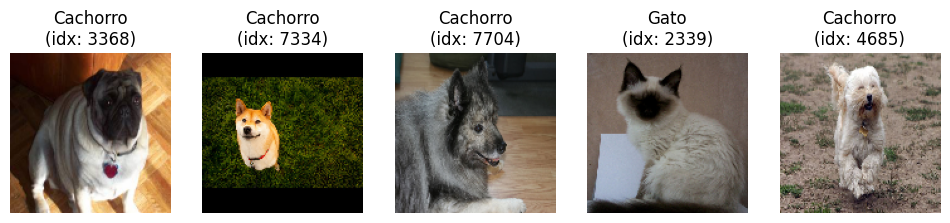

In [8]:
def show_class_distribution(y_data, title="Distribuição"):
    y_series = pd.Series(y_data)
    counts = y_series.value_counts().sort_index()
    
    print(f"--- {title} ---")
    print(f"Contagem detalhada:\n{counts}")
    print("-" * 20)

def plot_samples(X_data, y_data, img_size, n=5):
    """Mostra algumas imagens aleatórias."""
    plt.figure(figsize=(12, 4))
    
    n = min(n, len(X_data))
    
    indices = np.random.randint(0, len(X_data), n)
    
    for i, idx in enumerate(indices):
        plt.subplot(1, n, i+1)
        
        try:
            image = X_data[idx].reshape(img_size[0], img_size[1], 3)
            plt.imshow(image)
        except ValueError:
            try:
                image = X_data[idx].reshape(img_size[0], img_size[1])
                plt.imshow(image, cmap='gray')
            except ValueError:
                plt.text(0.5, 0.5, "Dados não\nsão imagem", ha='center')
                plt.axis("off")
                continue

        label = "Cachorro" if y_data[idx] == 1 else "Gato"
        
        plt.title(f"{label}\n(idx: {idx})")
        plt.axis("off")
    plt.show()

show_class_distribution(y_train_bal, "Contagem no Treino")
plot_samples(X_train_bal, y_train_bal, IMG_SIZE, n=5)

In [9]:
y_train_bal_dog = (y_train_bal == 1)
y_test_dog = (y_test == 1)

forest_clf = RandomForestClassifier(random_state=42)

In [ ]:
from skimage.feature import hog
from skimage import exposure
import cv2
import numpy as np
from tqdm import tqdm 

def extract_hog_features(X, img_size):
    """
    Aplica HOG em um conjunto de imagens achatadas (flattened).
    
    Args:
        X: Array numpy com as imagens achatadas (n_samples, n_pixels)
        img_size: Tupla (altura, largura) ex: (64, 64)
        
    Returns:
        X_hog: Array com as features extraídas
    """
    hog_features = []
    
    print(f"Extraindo HOG de {len(X)} imagens...")
    
    for i in tqdm(range(len(X))):
        img = X[i].reshape(img_size[0], img_size[1], 3)
       
        gray = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_BGR2GRAY)
        
        features = hog(gray, 
                       orientations=9, 
                       pixels_per_cell=(8, 8),
                       cells_per_block=(2, 2), 
                       block_norm='L2-Hys', 
                       visualize=False)
        
        hog_features.append(features)
        
    return np.array(hog_features)

In [11]:
X_train_hog = extract_hog_features(X_train_bal, IMG_SIZE)
X_test_hog  = extract_hog_features(X_test, IMG_SIZE)

Extraindo HOG de 7984 imagens...


100%|██████████| 7984/7984 [00:41<00:00, 192.70it/s]


Extraindo HOG de 1478 imagens...


100%|██████████| 1478/1478 [00:07<00:00, 194.09it/s]


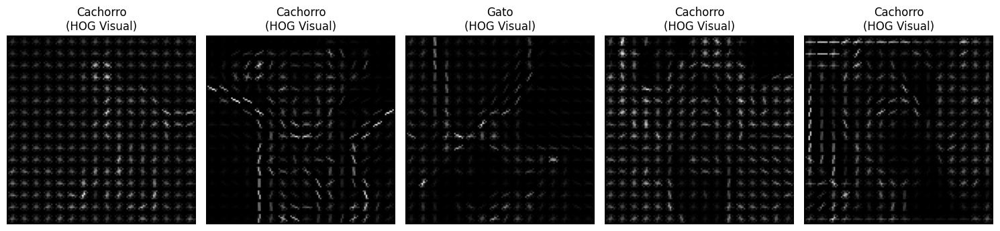

In [ ]:
from skimage.feature import hog
import matplotlib.pyplot as plt
import cv2
import numpy as np

def plot_hog_samples(X_raw, y_data, img_size, n=5):
    """
    Pega imagens originais, calcula o HOG na hora com visualize=True e mostra o resultado.
    """
    plt.figure(figsize=(15, 5))
    
    n = min(n, len(X_raw))
    indices = np.random.randint(0, len(X_raw), n)
    
    for i, idx in enumerate(indices):
        plt.subplot(1, n, i+1)
        
        image = X_raw[idx].reshape(img_size[0], img_size[1], 3)
        
        gray = cv2.cvtColor(image.astype('uint8'), cv2.COLOR_BGR2GRAY)
        
        _, hog_image = hog(gray, 
                           orientations=9, 
                           pixels_per_cell=(8, 8), 
                           cells_per_block=(2, 2), 
                           block_norm='L2-Hys', 
                           visualize=True)
        
        plt.imshow(hog_image, cmap='gray')
        
        label = "Cachorro" if y_data[idx] == 1 else "Gato"
        plt.title(f"{label}\n(HOG Visual)")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

plot_hog_samples(X_train, y_train, IMG_SIZE, n=5)

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding

print("4. Aplicando LLE...")
lle = LocallyLinearEmbedding(n_components=50, n_neighbors=15, random_state=42, n_jobs=-1)

X_train_final = lle.fit_transform(X_train_hog)

print("Aplicando LLE no Teste...")
X_test_final = lle.transform(X_test_hog)

4. Aplicando LLE...
LLE Treino concluído em 39.0s
Aplicando LLE no Teste...


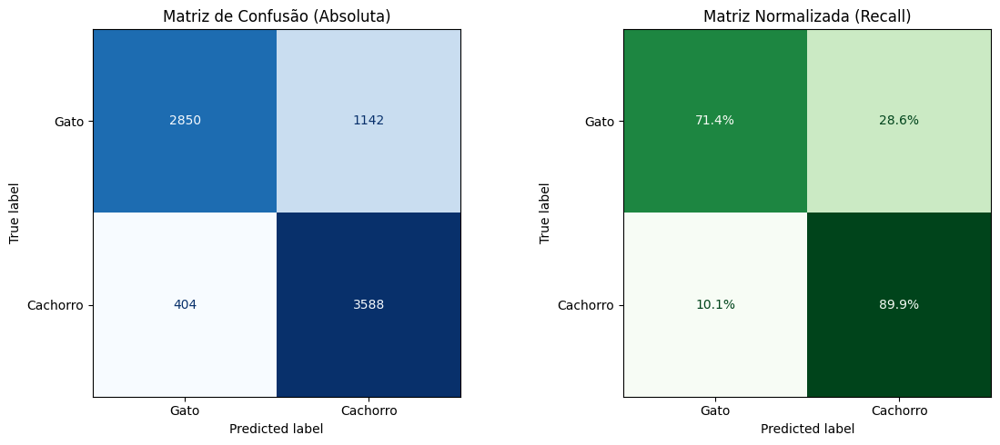

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

y_train_pred_rf = cross_val_predict(forest_clf, X_train_final, y_train_bal_dog, cv=5)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ConfusionMatrixDisplay.from_predictions(
    y_train_bal_dog, 
    y_train_pred_rf, 
    display_labels=["Gato", "Cachorro"], 
    values_format="d", 
    cmap="Blues", 
    ax=ax1,
    colorbar=False
)
ax1.set_title("Matriz de Confusão (Absoluta)")

ConfusionMatrixDisplay.from_predictions(
    y_train_bal_dog, 
    y_train_pred_rf, 
    display_labels=["Gato", "Cachorro"],
    normalize="true",  
    values_format=".1%", 
    cmap="Greens", 
    ax=ax2,
    colorbar=False
)
ax2.set_title("Matriz Normalizada (Recall)")

plt.tight_layout()
plt.show()

In [15]:
precision = precision_score(y_train_bal_dog, y_train_pred_rf)
recall = recall_score(y_train_bal_dog, y_train_pred_rf)
f1 = f1_score(y_train_bal_dog, y_train_pred_rf)

print("Métricas de desempenho:\n")
print("Precisão: \t\t %.2f"%(precision))
print("Revocação: \t\t %.2f"%(recall))
print("F1-score: \t\t %.2f"%(f1))

Métricas de desempenho:

Precisão: 		 0.76
Revocação: 		 0.90
F1-score: 		 0.82


In [16]:
y_probas_forest = cross_val_predict(forest_clf, X_train_final, y_train_bal_dog,
                                    cv=5, method="predict_proba")

y_scores_forest = y_probas_forest[:, 1]
precisions_forest, recalls_forest, thresholds_forest = precision_recall_curve(y_train_bal_dog, y_scores_forest)

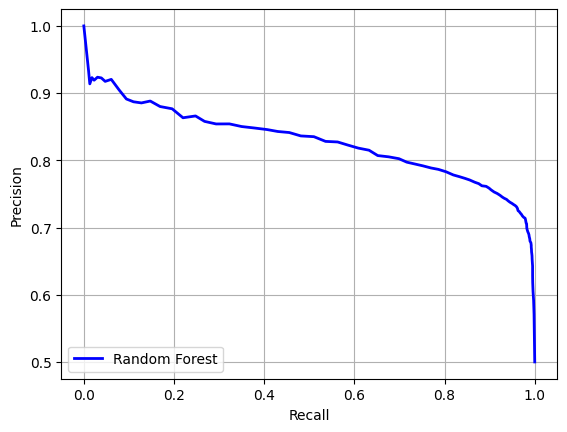

In [17]:
plt.plot(recalls_forest, precisions_forest, "b-", linewidth=2, label="Random Forest")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.legend(loc="lower left")
plt.draw()

In [ ]:
roc_auc = roc_auc_score(y_train_bal_dog, y_scores_forest)
print("ROC AUC:%.4f"%roc_auc)

ROC AUC:0.8700


In [19]:
fpr_forest, tpr_forest, thresholds = roc_curve(y_train_bal_dog, y_scores_forest)

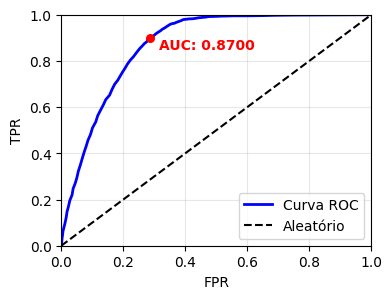

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_clean(y_true, y_scores):
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = roc_auc_score(y_true, y_scores)
    
    optimal_idx = np.argmax(tpr - fpr)
    optimal_fpr = fpr[optimal_idx]
    optimal_tpr = tpr[optimal_idx]
    
    plt.figure(figsize=(4, 3))
    
    plt.plot(fpr, tpr, linewidth=2, label='Curva ROC', color='blue')
    plt.plot([0, 1], [0, 1], 'k--', label='Aleatório')
    
    plt.scatter(optimal_fpr, optimal_tpr, color='red', s=30, zorder=5)
    
    plt.text(
        optimal_fpr + 0.03, 
        optimal_tpr - 0.05, 
        f'AUC: {roc_auc:.4f}', 
        fontsize=10, 
        color='red',
        fontweight='bold'
    )

    plt.axis([0, 1, 0, 1])
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.show()

plot_roc_clean(y_train_bal_dog, y_scores_forest)

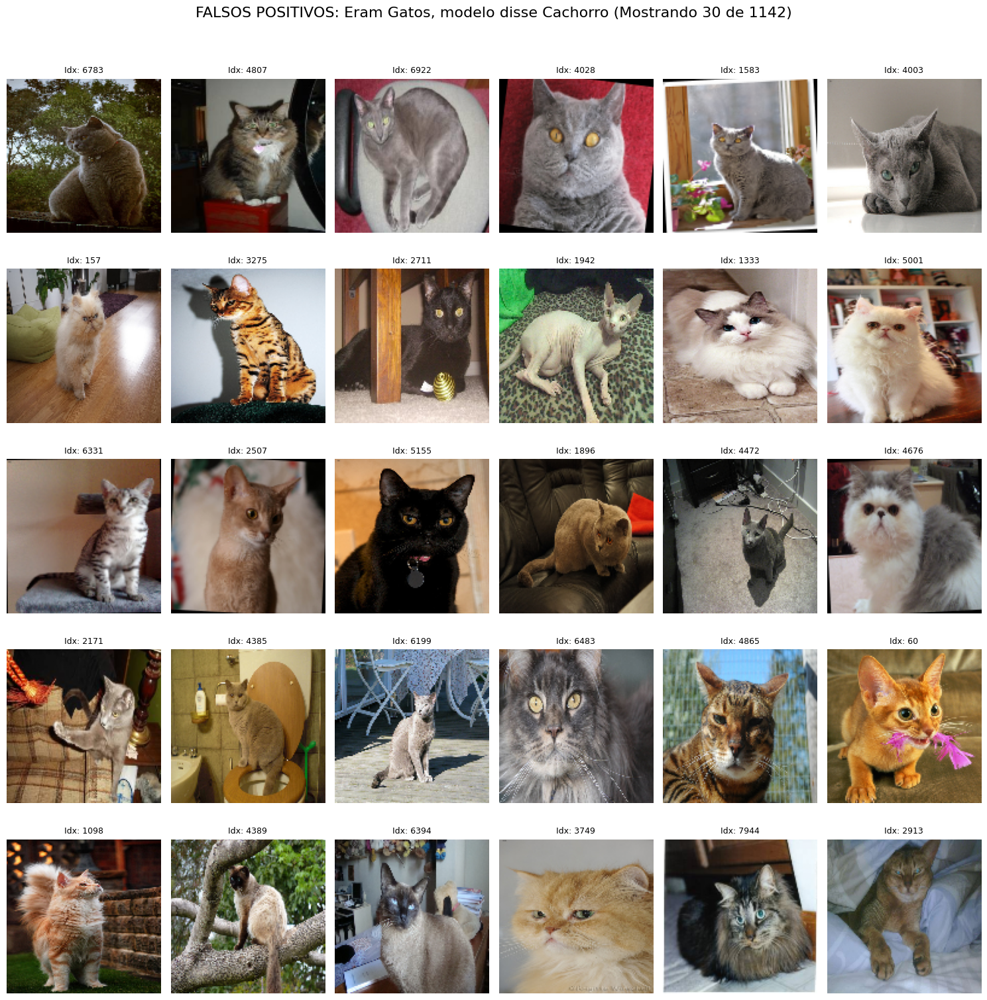

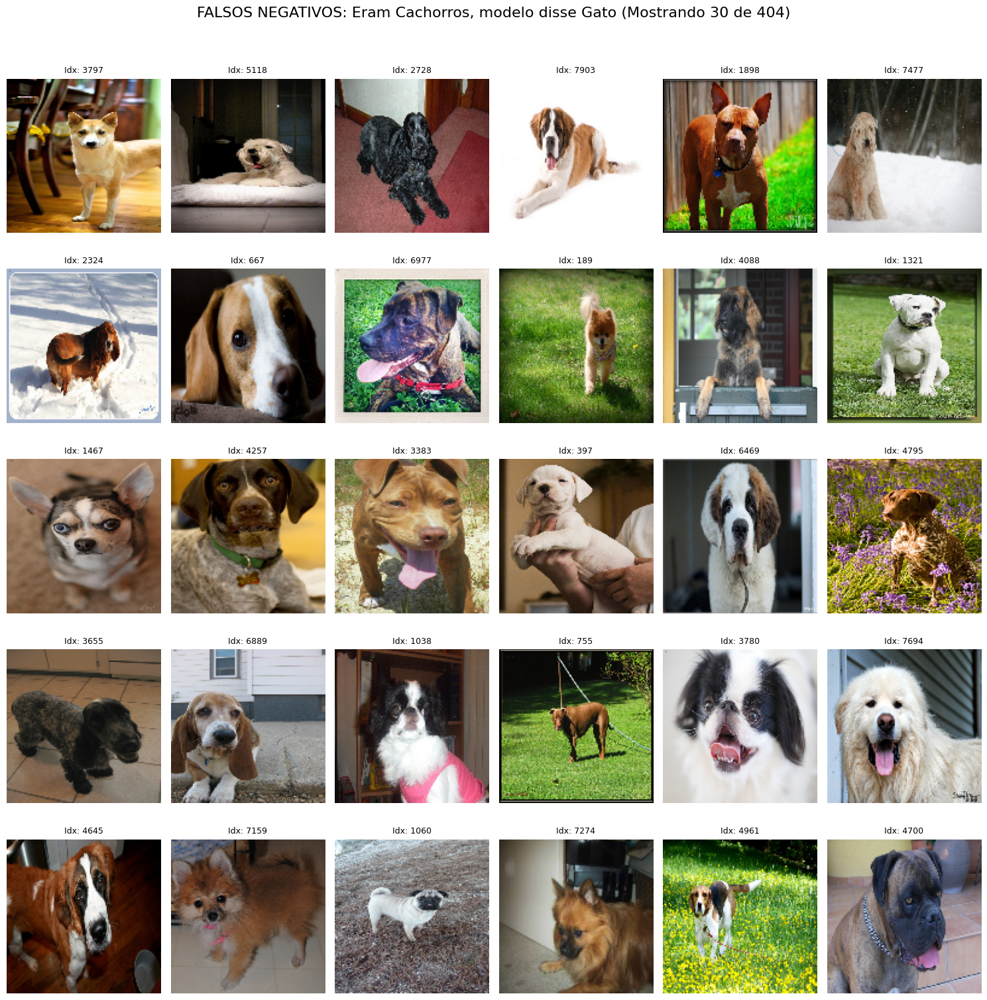

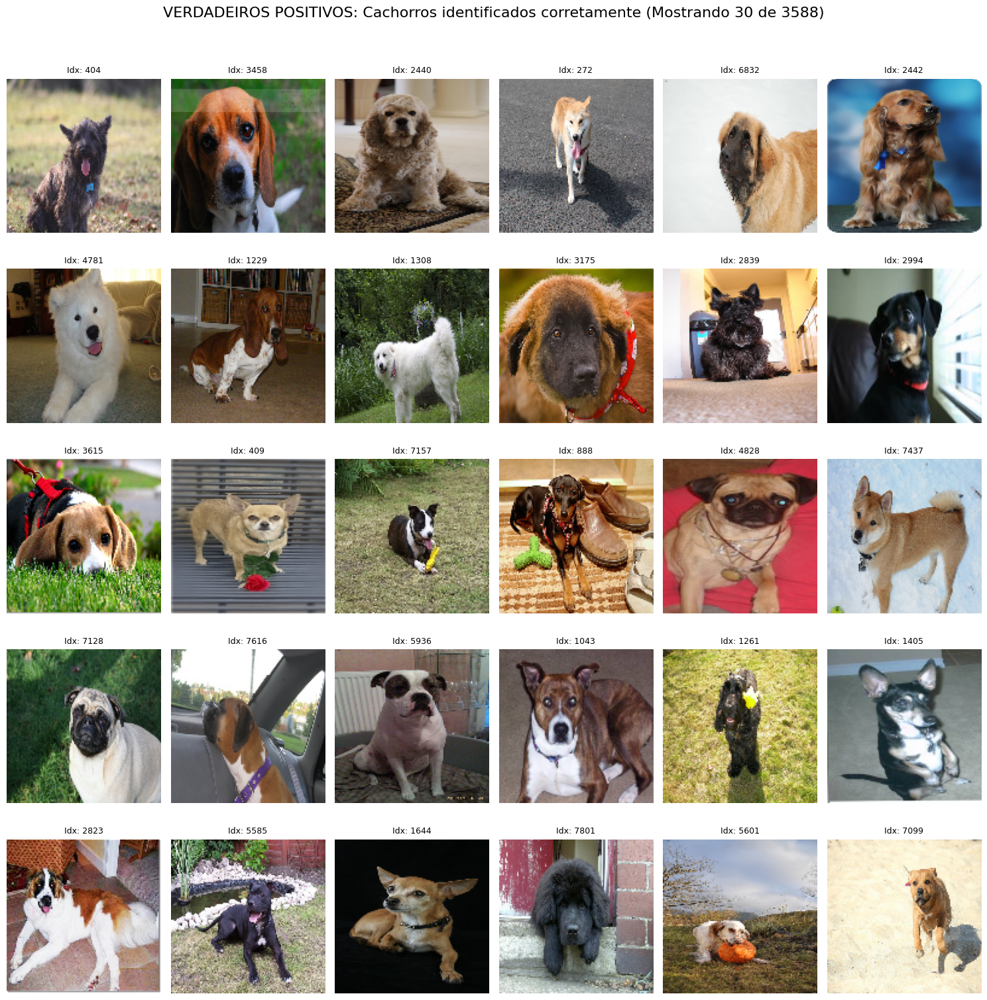

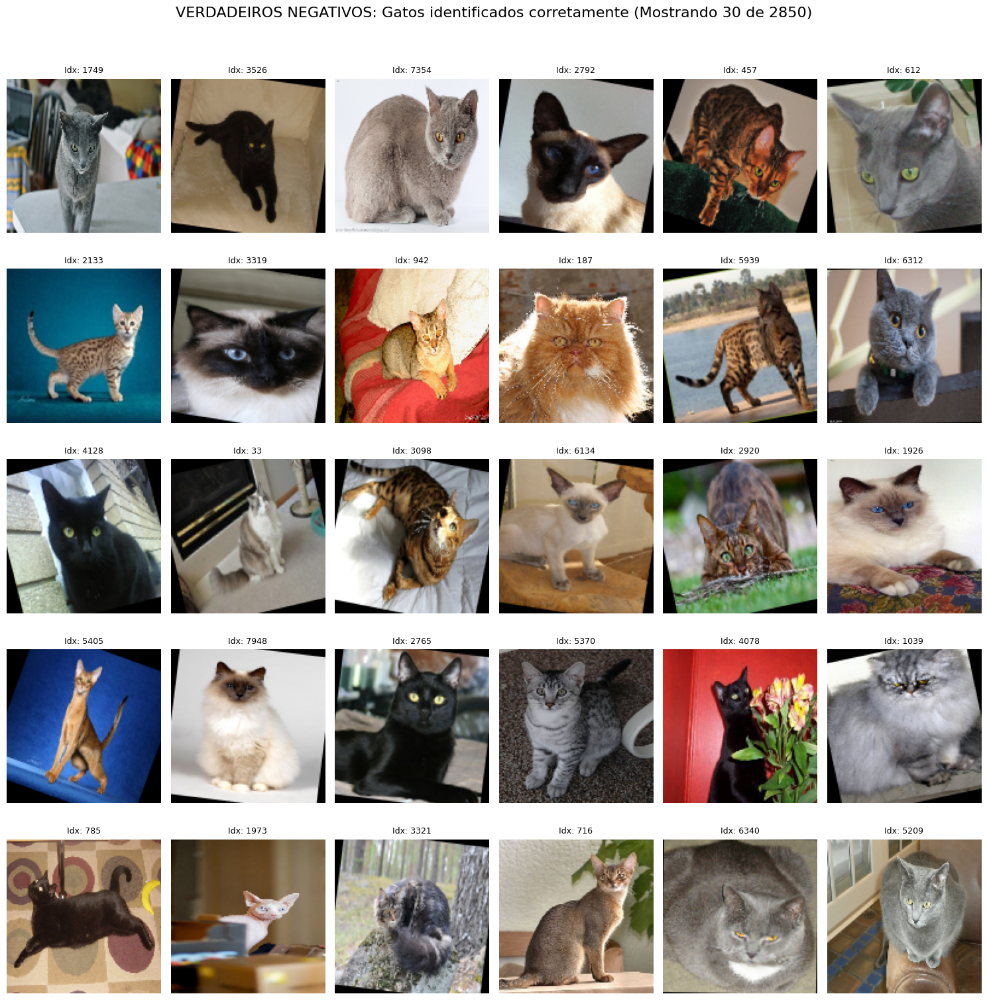

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ==============================================================================
# 1. CONFIGURAÇÕES INICIAIS
# ==============================================================================
IMG_DIM = (128, 128) 
N_AMOSTRAS = 30  

# ==============================================================================
# 2. FUNÇÃO DE PLOTAGEM (GALERIA)
# ==============================================================================
def plot_gallery(indices, X_data, title, n_imgs=30):
    if len(indices) == 0:
        print(f"--- Nenhum exemplo encontrado para: {title} ---")
        return

    n_display = min(len(indices), n_imgs)
    chosen_idxs = np.random.choice(indices, n_display, replace=False)
    
    cols = 6
    rows = math.ceil(n_display / cols)
    
    plt.figure(figsize=(15, 3 * rows))
    plt.suptitle(f"{title} (Mostrando {n_display} de {len(indices)})", fontsize=16, y=1.02)
    
    for i, idx in enumerate(chosen_idxs):
        ax = plt.subplot(rows, cols, i + 1)
        
        try:
            img = X_data[idx].reshape(IMG_DIM[0], IMG_DIM[1], 3)
            if img.max() > 1:
                img = img.astype(float) / 255.0
            plt.imshow(img)
        except ValueError:
            img = X_data[idx].reshape(IMG_DIM[0], IMG_DIM[1])
            plt.imshow(img, cmap='gray')
            
        plt.axis('off')
        plt.title(f"Idx: {idx}", fontsize=9)
    
    plt.tight_layout()
    plt.show()

# ==============================================================================
# 3. SEPARAÇÃO DOS ÍNDICES (QUADRANTES)
# ==============================================================================
y_true = np.array(y_train_bal_dog) # 1=Cachorro, 0=Gato
y_pred = np.array(y_train_pred_rf)

# --- GRUPO 1: FALSOS POSITIVOS ---
fp_idxs = np.where((y_true == 0) & (y_pred == 1))[0]

# --- GRUPO 2: FALSOS NEGATIVOS ---
fn_idxs = np.where((y_true == 1) & (y_pred == 0))[0]

# --- GRUPO 3: VERDADEIROS POSITIVOS ---
tp_idxs = np.where((y_true == 1) & (y_pred == 1))[0]

# --- GRUPO 4: VERDADEIROS NEGATIVOS ---
tn_idxs = np.where((y_true == 0) & (y_pred == 0))[0]

# ==============================================================================
# 4. EXIBIÇÃO (CORRIGIDA)
# ==============================================================================

dataset_viz = X_train_bal

plot_gallery(fp_idxs, dataset_viz, 
             title="FALSOS POSITIVOS")

plot_gallery(fn_idxs, dataset_viz, 
             title="FALSOS NEGATIVOS")

plot_gallery(tp_idxs, dataset_viz, 
             title="VERDADEIROS POSITIVOS")

plot_gallery(tn_idxs, dataset_viz, 
             title="VERDADEIROS NEGATIVOS")

In [ ]:
print("5. Treinando Random Forest Final...")
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
forest_clf.fit(X_train_final, y_train_bal_dog)

5. Treinando Random Forest Final...


RandomForestClassifier(n_jobs=-1, random_state=42)

Total de amostras no teste: 1478
Matriz de confusão (Teste):
 [[124 356]
 [ 94 904]]


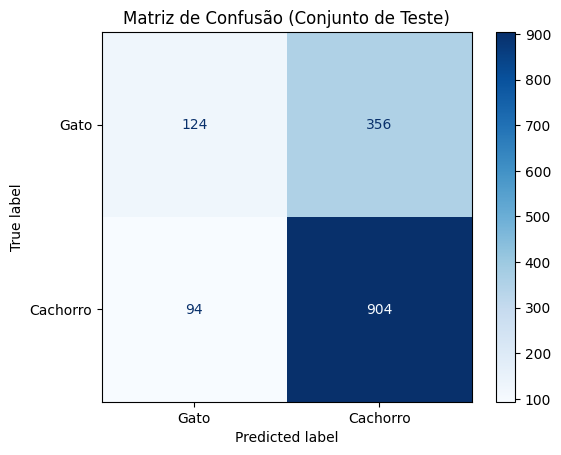

In [23]:
y_test_pred = forest_clf.predict(X_test_final)

cm_test = confusion_matrix(y_test_dog, y_test_pred)

print(f"Total de amostras no teste: {len(y_test_dog)}")
print("Matriz de confusão (Teste):\n", cm_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Gato', 'Cachorro'])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusão (Conjunto de Teste)")
plt.show()

In [24]:
precision = precision_score(y_train_bal_dog, y_train_pred_rf)
recall = recall_score(y_train_bal_dog, y_train_pred_rf)
f1 = f1_score(y_train_bal_dog, y_train_pred_rf)

print("Métricas de desempenho:\n")
print("Precisão: \t\t %.2f"%(precision))
print("Revocação: \t\t %.2f"%(recall))
print("F1-score: \t\t %.2f"%(f1))

Métricas de desempenho:

Precisão: 		 0.76
Revocação: 		 0.90
F1-score: 		 0.82


In [25]:
from sklearn.metrics import classification_report, accuracy_score

acc = accuracy_score(y_test_dog, y_test_pred)
print(f"=== RESULTADO FINAL NO TESTE ===")
print(f"Acurácia Global: {acc:.2%}")

report = classification_report(y_test_dog, y_test_pred, target_names=['Gato', 'Cachorro'])

print("Relatório de Classificação Detalhado:")
print(report)

=== RESULTADO FINAL NO TESTE ===
Acurácia Global: 69.55%
Relatório de Classificação Detalhado:
              precision    recall  f1-score   support

        Gato       0.57      0.26      0.36       480
    Cachorro       0.72      0.91      0.80       998

    accuracy                           0.70      1478
   macro avg       0.64      0.58      0.58      1478
weighted avg       0.67      0.70      0.66      1478

